In [1]:
# Third party packages.
import os

import pandas as pd             # Data handling
import polars as pl             # Data handling ('Blazingly fast DataFrames'), alternative to Pandas.
import polars.selectors as cs   # Select columns of particular type.
import numpy as np              # Numeric calculations
import pickle                   # Save and load data
import altair as alt            # Visualize data
alt.data_transformers.enable("vegafusion")
import seaborn as sns           # Visualize data
import matplotlib.pyplot as plt # Visualize data

from icecream import ic         # Print variables.

from sklearn.model_selection    import train_test_split     # Split data
from sklearn.preprocessing      import StandardScaler       # Scale data
from sklearn.linear_model       import LinearRegression     # Linear regression
from sklearn.linear_model       import LassoCV              # Lasso regression
from sklearn.preprocessing      import OneHotEncoder        # One hot encoding
from sklearn.neighbors          import KNeighborsRegressor  # KNN regression
from sklearn.model_selection    import GridSearchCV         # Grid search

### Load Parquet File

In [2]:
df_pipe1 = pd.read_parquet(f'../Experiment/Knee/data/interim/2.1-train.parquet')
df_pipe1.shape

(94550, 46)

In [3]:
df_pipe1.head(3)

,Provider Code,Procedure,Revision Flag,Year,Age Band,Gender,Pre-Op Q Assisted,Pre-Op Q Assisted By,Pre-Op Q Symptom Period,Pre-Op Q Previous Surgery,...,Knee Replacement Pre-Op Q Walking,Knee Replacement Pre-Op Q Standing,Knee Replacement Pre-Op Q Limping,Knee Replacement Pre-Op Q Kneeling,Knee Replacement Pre-Op Q Work,Knee Replacement Pre-Op Q Confidence,Knee Replacement Pre-Op Q Shopping,Knee Replacement Pre-Op Q Stairs,Knee Replacement Pre-Op Q Score,health_gain
0,268,1,0,3,5,2.0,2,1,2,2,...,1,1,0,0,0,1,0,0,7.0,16.0
1,69,1,0,2,4,1.0,2,1,2,2,...,0,2,1,2,2,3,3,2,26.0,12.0
2,267,1,0,2,2,2.0,2,1,4,2,...,2,2,1,1,1,2,1,2,20.0,8.0


### Notebook Settings

In [4]:
# Pandas.
pd.set_option("display.max_rows", None)         # How many rows to display when printing a DataFrame? None shows all rows.
pd.set_option("display.max_columns", None)      # How many columns to display when printing a DataFrame? None shows all columns.
pd.set_option("display.max_info_columns", 100)  # How many rows to display for .info()?
pd.set_option("display.max_info_rows", 1000000) # How many columns to display for .info()?
pd.set_option("display.precision", 2)           # How many decimals to show when printing a DataFrame?

### Health Gain Analysis: Outcome Variable 

Descriptive Statistics of the outcome variable

In [5]:
hg_y = df_pipe1['health_gain']

print("Summary statistics of health gain (Y):")
print(f"Mean:   {round(hg_y.mean(), 1)}")
print(f"Median: {round(hg_y.median(), 1)}")
print(f"Std:    {round(hg_y.std(), 1)}")
print(f"Range:  {hg_y.min()} till {hg_y.max()}")

Summary statistics of health gain (Y):
Mean:   17.0
Median: 17.0
Std:    9.800000190734863
Range:  -36.0 till 46.0


In [6]:
alt1 = alt.Chart(data=df_pipe1).mark_bar().encode(
    x = 'health_gain',
    y = 'count()'
)

alt2 = alt.Chart(data=df_pipe1).mark_bar().encode(
    alt.X('health_gain', bin=alt.Bin(maxbins=32)),
    alt.Y('count()', title='Count')
)

alt1 | alt2

alt.HConcatChart(...)

Log-Transformation

In [7]:
# Create log-transformed version of health_gain
hg_y_log = np.log(hg_y)

# Add health_gain_log to df_pipe1.

# Pandas:
df_pipe1['health_gain_log'] = hg_y_log

/Users/mendelgoldberg/.pyenv/versions/3.10.13/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/mendelgoldberg/.pyenv/versions/3.10.13/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [8]:
# Let's compare the distribution of 'df_pipe1' and 'df_pipe1_log'. Looks much better!
alt1 = alt.Chart(data=df_pipe1).mark_bar().encode(
    alt.X('health_gain', bin=alt.Bin(step=10)),
    alt.Y('count()', title='Count')
).properties(
    title='Original health_gain distribution'
)

alt2 = alt.Chart(data=df_pipe1).mark_bar().encode(
    alt.X('health_gain_log', bin=alt.Bin(step=1)),
    alt.Y('count()', title='Count')
).properties(
    title='Log-transformed health_gain distribution'
)

alt1 | alt2

alt.HConcatChart(...)

Scatterplot

In [9]:
# Create scatter plot - Part I
alt1 = alt.Chart(df_pipe1).mark_circle().encode(
    x = 'Age Band',
    y = 'health_gain',
)

alt2 = alt.Chart(df_pipe1).mark_circle().encode(
    x = 'Knee Replacement Pre-Op Q Score',
    y = 'health_gain',
)

alt1 | alt2

alt.HConcatChart(...)

### Correlation

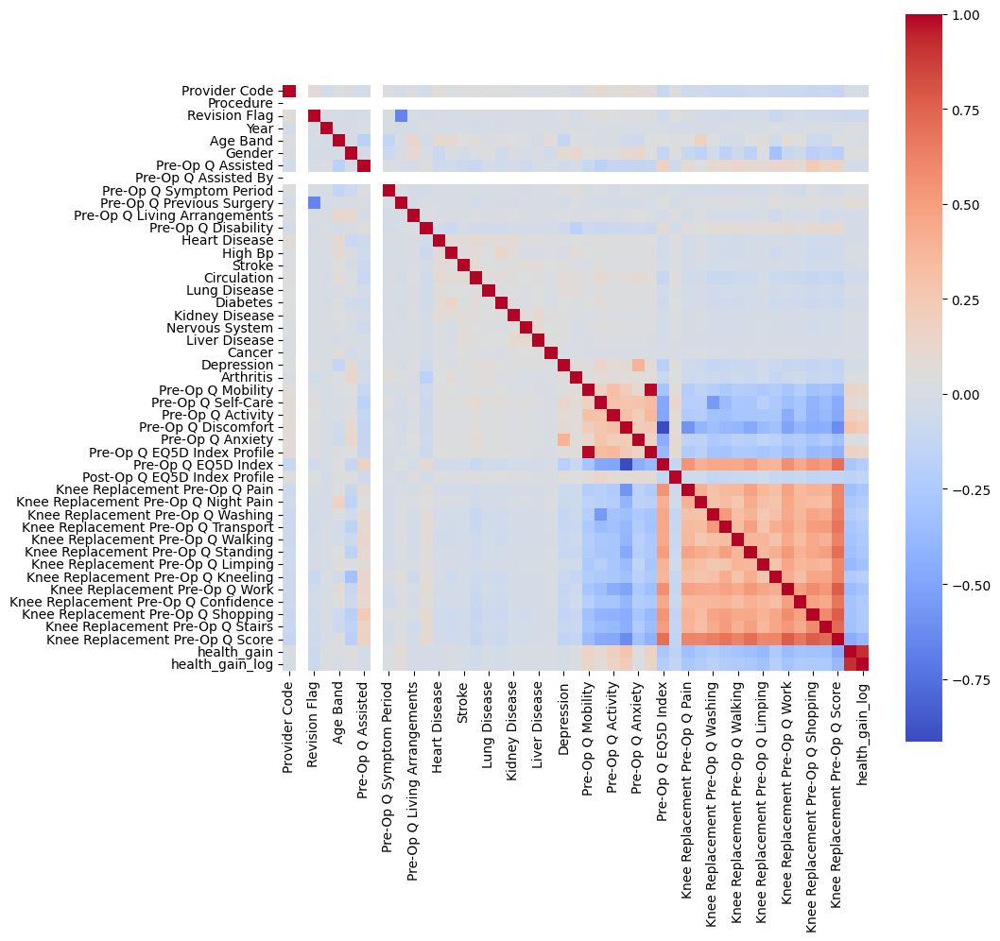

In [10]:
plt.figure(figsize=(10, 10)) 

sns.heatmap(
    data   = df_pipe1.corr(), 
    annot  = False,
    square = True,
    cmap   = 'coolwarm'
);

In [11]:
# Calculate correlations with health gain and create sorted table
corr_matrix = df_pipe1.corr()

# Get correlations with 'health_gain' (adjust column name if different)
# Look for health gain column
health_gain_col = [col for col in df_pipe1.columns if 'health' in col.lower() and 'gain' in col.lower()]
if health_gain_col:
    target = health_gain_col[0]
    corr_with_target = corr_matrix[target].drop(target).sort_values()
    
    # Create a nice table
    corr_table = pd.DataFrame({
        'Variable': corr_with_target.index,
        'Correlation with Health Gain': corr_with_target.values
    }).reset_index(drop=True)
    
    print(f"Correlations with '{target}' (sorted ascending):\n")
    print(corr_table.to_string(index=False))
else:
    print("Health gain column not found. Available columns:")
    print(df.columns)

Correlations with 'health_gain' (sorted ascending):

                            Variable  Correlation with Health Gain
     Knee Replacement Pre-Op Q Score                     -4.54e-01
   Knee Replacement Pre-Op Q Limping                     -3.71e-01
      Knee Replacement Pre-Op Q Work                     -3.60e-01
  Knee Replacement Pre-Op Q Standing                     -3.35e-01
      Knee Replacement Pre-Op Q Pain                     -3.31e-01
    Knee Replacement Pre-Op Q Stairs                     -3.16e-01
  Knee Replacement Pre-Op Q Shopping                     -3.15e-01
Knee Replacement Pre-Op Q Confidence                     -3.07e-01
   Knee Replacement Pre-Op Q Walking                     -3.03e-01
 Knee Replacement Pre-Op Q Transport                     -2.84e-01
                 Pre-Op Q EQ5D Index                     -2.74e-01
Knee Replacement Pre-Op Q Night Pain                     -2.70e-01
  Knee Replacement Pre-Op Q Kneeling                     -2.43e-01
   Knee R

### Train-Test Split